### Import Modules

In [ ]:
!pip install torchmetrics[image] torch-fidelity

In [ ]:
!pip install torchmetrics

In [ ]:
!export LC_ALL=C.UTF-8 && export LANG=C.UTF-8 && pip install optuna

In [ ]:
# import sys
# !{sys.executable} -m pip install --no-cache-dir --force-reinstall optuna

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.utils as vutils
import torchvision.transforms as transforms
import torchvision.datasets as datasets
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader, Dataset, TensorDataset, random_split, ConcatDataset
from torchmetrics.image.inception import InceptionScore
from torchmetrics.image.fid import FrechetInceptionDistance

import pandas as pd
import optuna
import pickle
import matplotlib.pyplot as plt
import os
import numpy as np
from tqdm import tqdm
from sklearn.metrics import accuracy_score, precision_score, recall_score

### Load and Prepare Data

In [ ]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"xkcdxkcd","key":"f0a42cfd70a37bd4c58f515fa55f4d8a"}'}

In [ ]:
!mkdir -p ~/.kaggle
!mv kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download -d jessicali9530/celeba-dataset
!unzip celeba-dataset.zip -d celeba

Dataset URL: https://www.kaggle.com/datasets/jessicali9530/celeba-dataset
License(s): other
celeba-dataset.zip: Skipping, found more recently modified local copy (use --force to force download)
Archive:  celeba-dataset.zip
replace celeba/img_align_celeba/img_align_celeba/000001.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace celeba/img_align_celeba/img_align_celeba/000002.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace celeba/img_align_celeba/img_align_celeba/000003.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [ ]:
transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

data_dir = "celeba/img_align_celeba"
dataset = ImageFolder(root=data_dir, transform=transform)

train_size = int(0.8 * len(dataset))
val_size = int(0.1 * len(dataset))
test_size = len(dataset) - train_size - val_size

train_dataset, val_dataset, test_dataset = random_split(dataset, [train_size, val_size, test_size])

batch_size = 64
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

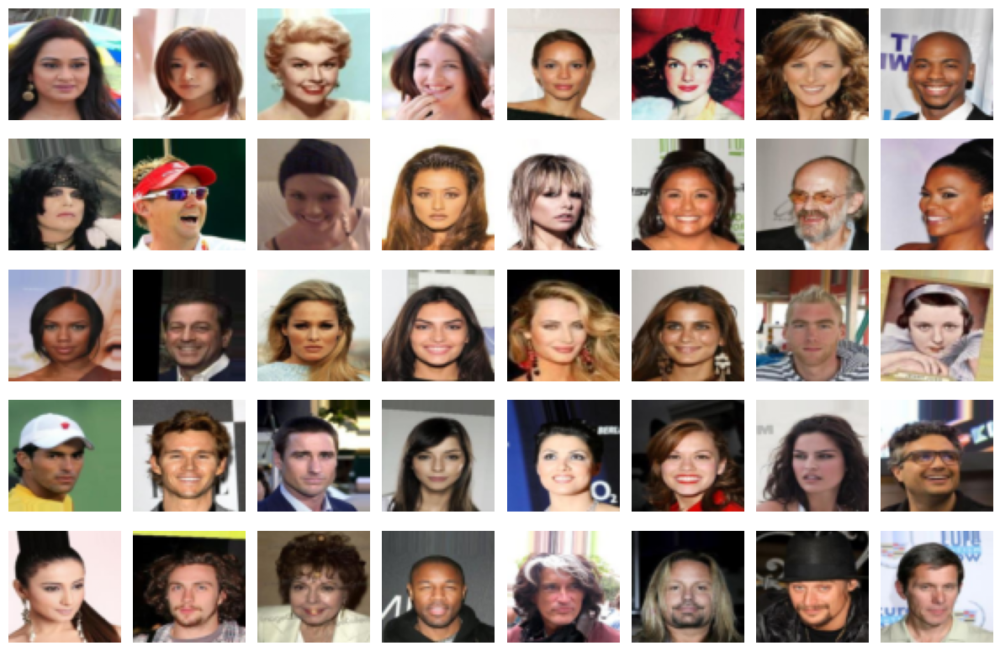

In [ ]:
dataiter = iter(train_loader)
images, _ = next(dataiter)

images = images * 0.5 + 0.5

fig, axes = plt.subplots(5, 8, figsize=(12, 8))

for i, ax in enumerate(axes.flat):
    if i < len(images):
        img = images[i].permute(1, 2, 0).numpy()
        ax.imshow(img)
        ax.axis('off')

plt.tight_layout()
plt.show()

### WGAN for Synthetic Data Generation

In [ ]:
image_size = 64
nz = 100
weight_clip = 0.01
n_critic = 5
num_epochs = 8
batch_size = 128
g_lr = 0.0001
d_lr = 0.0001
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
class Generator(nn.Module):
    def __init__(self, nz):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            nn.ConvTranspose2d(nz, 256, 4, 1, 0, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            nn.ConvTranspose2d(256, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            nn.ConvTranspose2d(128, 64, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.ConvTranspose2d(64, 32, 4, 2, 1, bias=False),
            nn.BatchNorm2d(32),
            nn.ReLU(True),
            nn.ConvTranspose2d(32, 3, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, x):
        return self.main(x)

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(3, 64, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(256, 512, 4, 2, 1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(512, 1, 4, 1, 0, bias=False),
        )

    def forward(self, x):
        return self.main(x).view(-1, 1)

In [ ]:
generator = Generator(nz).to(device)
discriminator = Discriminator().to(device)

In [ ]:
optimizer_G = optim.RMSprop(generator.parameters(), lr=g_lr)
optimizer_D = optim.RMSprop(discriminator.parameters(), lr=d_lr)

g_loss_log = []
d_loss_log = []

In [ ]:
inception_score = InceptionScore(feature=2048).to(device)
fid_score = FrechetInceptionDistance(feature=2048).to(device)

Epoch 1/8: 100%|██████████| 2533/2533 [14:33<00:00,  2.90it/s, D_Loss=-1.32, G_Loss=0.661]


Epoch [1/8] Loss D: -1.3192, Loss G: 0.6613


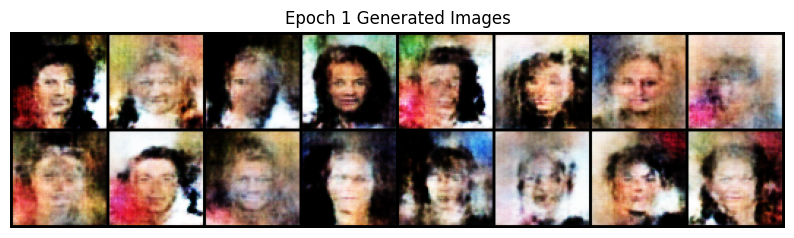

Inception Score (IS): 1.0251 ± 0.0069
Fréchet Inception Distance (FID): 340.6271


Epoch 2/8: 100%|██████████| 2533/2533 [14:45<00:00,  2.86it/s, D_Loss=-1.03, G_Loss=0.531]


Epoch [2/8] Loss D: -1.0284, Loss G: 0.5308


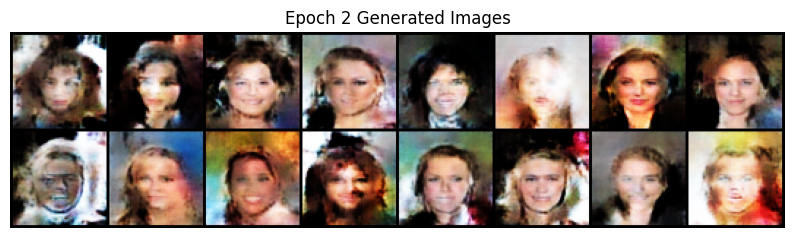

Inception Score (IS): 1.0461 ± 0.0063
Fréchet Inception Distance (FID): 249.8666


Epoch 3/8: 100%|██████████| 2533/2533 [14:54<00:00,  2.83it/s, D_Loss=-0.876, G_Loss=0.463]

Epoch [3/8] Loss D: -0.8758, Loss G: 0.4634


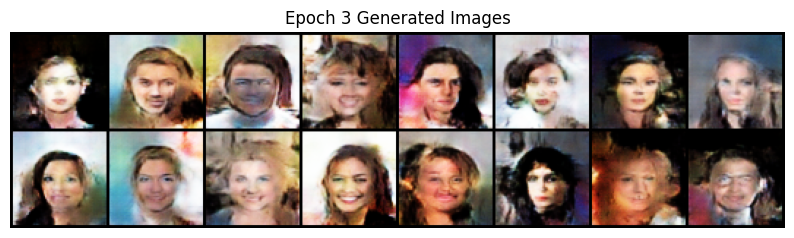

Inception Score (IS): 1.0455 ± 0.0082
Fréchet Inception Distance (FID): 211.7168


Epoch 4/8: 100%|██████████| 2533/2533 [15:02<00:00,  2.81it/s, D_Loss=-0.77, G_Loss=0.413]

Epoch [4/8] Loss D: -0.7705, Loss G: 0.4127


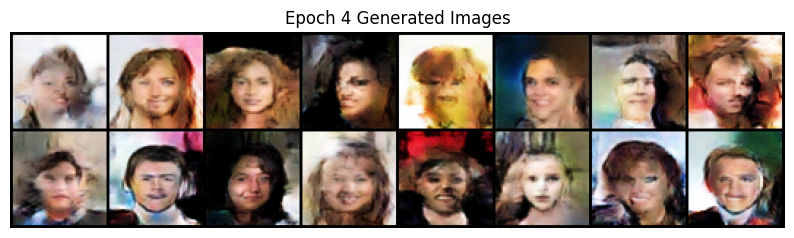

Inception Score (IS): 1.0440 ± 0.0167
Fréchet Inception Distance (FID): 193.5548


Epoch 5/8: 100%|██████████| 2533/2533 [15:10<00:00,  2.78it/s, D_Loss=-0.706, G_Loss=0.381]

Epoch [5/8] Loss D: -0.7063, Loss G: 0.3814


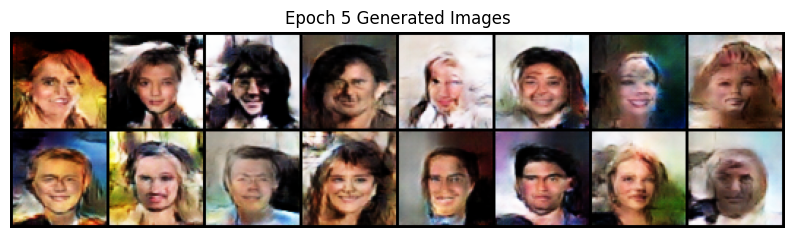

Inception Score (IS): 1.0487 ± 0.0060
Fréchet Inception Distance (FID): 178.5388


Epoch 6/8: 100%|██████████| 2533/2533 [15:27<00:00,  2.73it/s, D_Loss=-0.665, G_Loss=0.355]

Epoch [6/8] Loss D: -0.6649, Loss G: 0.3551


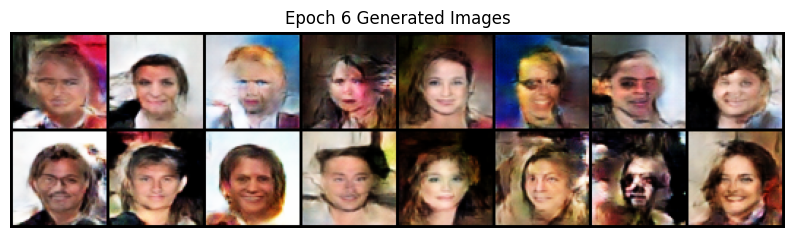

Inception Score (IS): 1.0503 ± 0.0061
Fréchet Inception Distance (FID): 165.1208


Epoch 7/8: 100%|██████████| 2533/2533 [15:26<00:00,  2.73it/s, D_Loss=-0.632, G_Loss=0.335]

Epoch [7/8] Loss D: -0.6324, Loss G: 0.3354


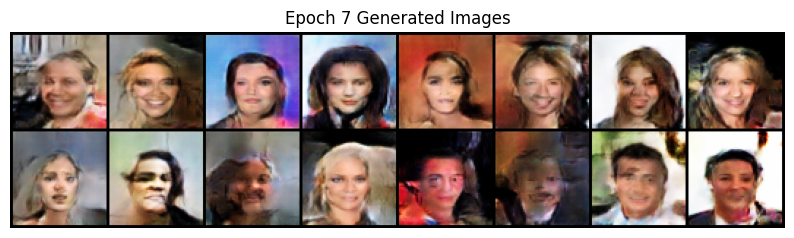

Inception Score (IS): 1.0504 ± 0.0063
Fréchet Inception Distance (FID): 155.7046


Epoch 8/8: 100%|██████████| 2533/2533 [15:31<00:00,  2.72it/s, D_Loss=-0.613, G_Loss=0.317]


Epoch [8/8] Loss D: -0.6128, Loss G: 0.3172


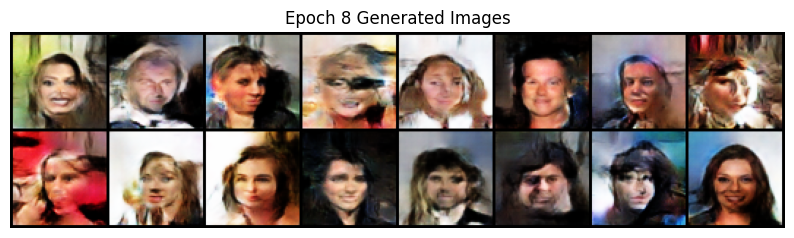

Inception Score (IS): 1.0524 ± 0.0067
Fréchet Inception Distance (FID): 149.0813


In [ ]:
for epoch in range(num_epochs):
    g_losses = []
    d_losses = []

    with tqdm(enumerate(train_loader), total=len(train_loader), desc=f"Epoch {epoch+1}/{num_epochs}") as pbar:
        for i, (real_images, _) in pbar:
            real_images = real_images.to(device)
            current_batch_size = real_images.size(0)

            # train discriminator
            for _ in range(n_critic):
                optimizer_D.zero_grad()

                real_outputs = discriminator(real_images)
                fake_images = generator(torch.randn(current_batch_size, nz, 1, 1).to(device))
                fake_outputs = discriminator(fake_images.detach())

                d_loss = -torch.mean(real_outputs) + torch.mean(fake_outputs)
                d_loss.backward()
                optimizer_D.step()

                for p in discriminator.parameters():
                    p.data.clamp_(-weight_clip, weight_clip)

            # train generator
            optimizer_G.zero_grad()
            fake_outputs = discriminator(fake_images)
            g_loss = -torch.mean(fake_outputs)
            g_loss.backward()
            optimizer_G.step()

            g_losses.append(g_loss.item())
            d_losses.append(d_loss.item())

            pbar.set_postfix(D_Loss=np.mean(d_losses), G_Loss=np.mean(g_losses))

    g_loss_log.append(np.mean(g_losses))
    d_loss_log.append(np.mean(d_losses))

    print(f"Epoch [{epoch+1}/{num_epochs}] Loss D: {np.mean(d_losses):.4f}, Loss G: {np.mean(g_losses):.4f}")

    # generate/ visualize samples
    with torch.no_grad():
        z = torch.randn(16, nz, 1, 1).to(device)
        sample_images = generator(z)
        grid = vutils.make_grid(sample_images, normalize=True, scale_each=True)

        plt.figure(figsize=(10, 10))
        plt.axis("off")
        plt.title(f"Epoch {epoch+1} Generated Images")
        plt.imshow(grid.permute(1, 2, 0).cpu().numpy())
        plt.show()

        sample_images_uint8 = ((sample_images + 1) * 127.5).clamp(0, 255).to(torch.uint8)
        real_images_uint8 = ((real_images + 1) * 127.5).clamp(0, 255).to(torch.uint8)

        inception_score.update(sample_images_uint8)
        fid_score.update(sample_images_uint8, real=True)
        fid_score.update(real_images_uint8, real=False)

        is_mean, is_std = inception_score.compute()
        fid_value = fid_score.compute()

        print(f"Inception Score (IS): {is_mean:.4f} ± {is_std:.4f}")
        print(f"Fréchet Inception Distance (FID): {fid_value:.4f}")

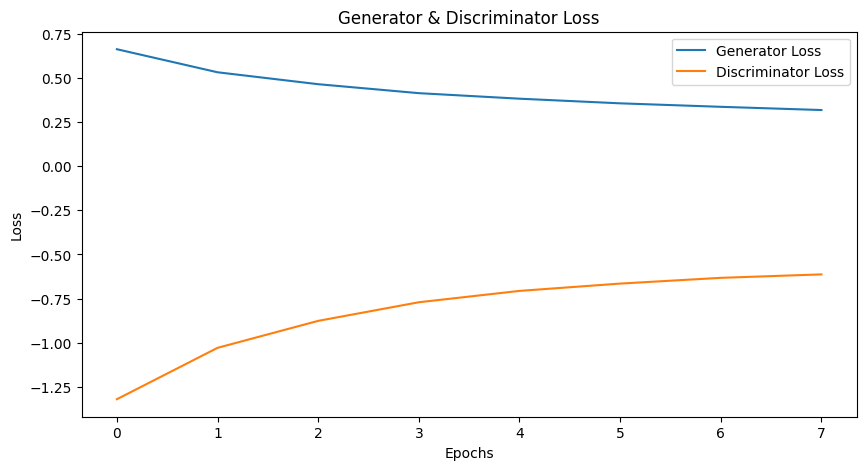

In [ ]:
plt.figure(figsize=(10, 5))
plt.plot(range(num_epochs), g_loss_log, label="Generator Loss")
plt.plot(range(num_epochs), d_loss_log, label="Discriminator Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.title("Generator & Discriminator Loss")
plt.show()

### Hyperparameter Tuning

In [ ]:
def objective(trial):
    # smaple hyperparameters
    g_lr = trial.suggest_loguniform("g_lr", 1e-5, 1e-3)
    d_lr = trial.suggest_loguniform("d_lr", 1e-5, 1e-3)
    batch_size = trial.suggest_categorical("batch_size", [64, 128, 256])
    nz = trial.suggest_int("latent_dim", 64, 256, step=32)  # latent vector size

    train_loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

    generator = Generator(nz).to(device)
    discriminator = Discriminator().to(device)

    optimizer_G = optim.RMSprop(generator.parameters(), lr=g_lr)
    optimizer_D = optim.RMSprop(discriminator.parameters(), lr=d_lr)

    inception_score = InceptionScore(feature=2048).to(device)
    fid_score = FrechetInceptionDistance(feature=2048).to(device)

    num_epochs = 3
    best_fid = float("inf")
    best_generator_state = None

    for epoch in range(num_epochs):
        g_losses = []
        d_losses = []

        for real_images, _ in train_loader:
            real_images = real_images.to(device)
            current_batch_size = real_images.size(0)

            # train discriminator
            for _ in range(n_critic):
                optimizer_D.zero_grad()
                real_outputs = discriminator(real_images)
                fake_images = generator(torch.randn(current_batch_size, nz, 1, 1).to(device))
                fake_outputs = discriminator(fake_images.detach())
                d_loss = -torch.mean(real_outputs) + torch.mean(fake_outputs)
                d_loss.backward()
                optimizer_D.step()

                for p in discriminator.parameters():
                    p.data.clamp_(-weight_clip, weight_clip)

            # train generator
            optimizer_G.zero_grad()
            fake_outputs = discriminator(fake_images)
            g_loss = -torch.mean(fake_outputs)
            g_loss.backward()
            optimizer_G.step()

            g_losses.append(g_loss.item())
            d_losses.append(d_loss.item())

        with torch.no_grad():
            fake_images_uint8 = ((fake_images + 1) * 127.5).clamp(0, 255).to(torch.uint8)
            real_images_uint8 = ((real_images + 1) * 127.5).clamp(0, 255).to(torch.uint8)
            inception_score.update(fake_images_uint8)
            fid_score.update(fake_images_uint8, real=True)
            fid_score.update(real_images_uint8, real=False)

            is_score = inception_score.compute()[0].item()
            fid_value = fid_score.compute().item()

        trial.report(fid_value, epoch)

        # stop unpromising trials early
        if trial.should_prune():
            raise optuna.exceptions.TrialPruned()

        # save best generator model
        if fid_value < best_fid:
            best_fid = fid_value
            best_generator_state = generator.state_dict()

    return best_fid

study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=20)

[I 2025-03-23 18:16:21,813] A new study created in memory with name: no-name-a3012aee-73bc-47a7-8742-f56c29b63986
<ipython-input-36-e238fe23562a>:3: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  g_lr = trial.suggest_loguniform("g_lr", 1e-5, 1e-3)
<ipython-input-36-e238fe23562a>:4: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  d_lr = trial.suggest_loguniform("d_lr", 1e-5, 1e-3)
/usr/local/lib/python3.11/dist-packages/torchmetrics/utilities/prints.py:43: UserWarning: Metric `InceptionScore` will save all extracted features in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)
[I 2025-03-23 19:10:31,580] Trial 0 finished wi

##### Train Best Model

In [ ]:
''' best hyperparams '''
image_size = 64
nz = 160
weight_clip = 0.01
n_critic = 5
num_epochs = 20
batch_size = 256
g_lr = 0.00025
d_lr = 2.4e-05
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
generator = Generator(nz).to(device)
discriminator = Discriminator().to(device)

In [ ]:
train_loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

In [ ]:
optimizer_G = optim.RMSprop(generator.parameters(), lr=g_lr)
optimizer_D = optim.RMSprop(discriminator.parameters(), lr=d_lr)

g_loss_log = []
d_loss_log = []

In [ ]:
inception_score = InceptionScore(feature=2048).to(device)
fid_score = FrechetInceptionDistance(feature=2048).to(device)

/usr/local/lib/python3.11/dist-packages/torchmetrics/utilities/prints.py:43: UserWarning: Metric `InceptionScore` will save all extracted features in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)
Downloading: "https://github.com/toshas/torch-fidelity/releases/download/v0.2.0/weights-inception-2015-12-05-6726825d.pth" to /root/.cache/torch/hub/checkpoints/weights-inception-2015-12-05-6726825d.pth
100%|██████████| 91.2M/91.2M [00:00<00:00, 380MB/s]


Epoch 1/20: 100%|██████████| 396/396 [09:18<00:00,  1.41s/it, D_Loss=-0.272, G_Loss=0.15]


Epoch [1/20] Loss D: -0.2719, Loss G: 0.1497


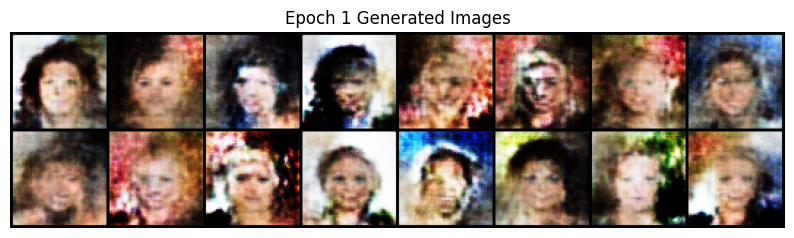

Inception Score (IS): 1.0258 ± 0.0047
Fréchet Inception Distance (FID): 397.1738


Epoch 2/20: 100%|██████████| 396/396 [09:23<00:00,  1.42s/it, D_Loss=-0.425, G_Loss=0.252]

Epoch [2/20] Loss D: -0.4252, Loss G: 0.2523


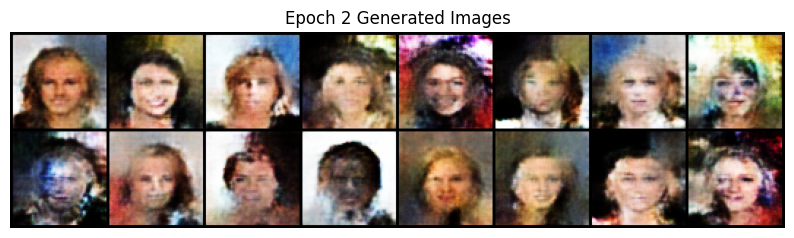

Inception Score (IS): 1.0454 ± 0.0038
Fréchet Inception Distance (FID): 316.5236


Epoch 3/20: 100%|██████████| 396/396 [09:23<00:00,  1.42s/it, D_Loss=-0.445, G_Loss=0.259]

Epoch [3/20] Loss D: -0.4453, Loss G: 0.2592


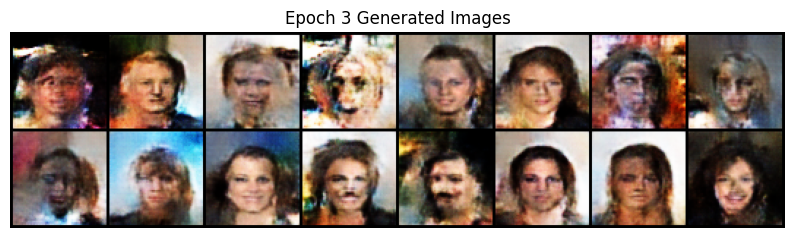

Inception Score (IS): 1.0474 ± 0.0095
Fréchet Inception Distance (FID): 272.2372


Epoch 4/20: 100%|██████████| 396/396 [09:21<00:00,  1.42s/it, D_Loss=-0.45, G_Loss=0.257]

Epoch [4/20] Loss D: -0.4502, Loss G: 0.2566


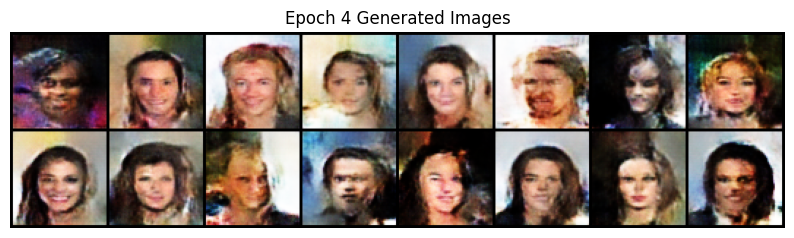

Inception Score (IS): 1.0497 ± 0.0200
Fréchet Inception Distance (FID): 234.7603


Epoch 5/20: 100%|██████████| 396/396 [09:21<00:00,  1.42s/it, D_Loss=-0.438, G_Loss=0.252]

Epoch [5/20] Loss D: -0.4376, Loss G: 0.2519


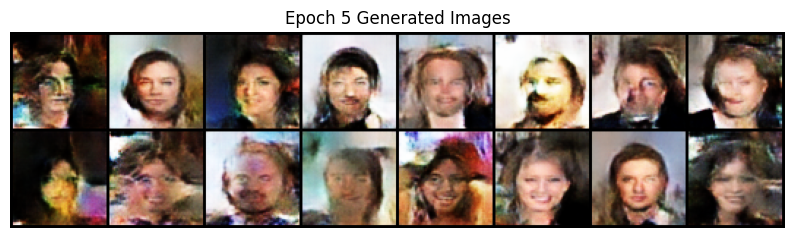

Inception Score (IS): 1.0563 ± 0.0082
Fréchet Inception Distance (FID): 217.5892


Epoch 6/20: 100%|██████████| 396/396 [09:22<00:00,  1.42s/it, D_Loss=-0.429, G_Loss=0.245]


Epoch [6/20] Loss D: -0.4290, Loss G: 0.2455


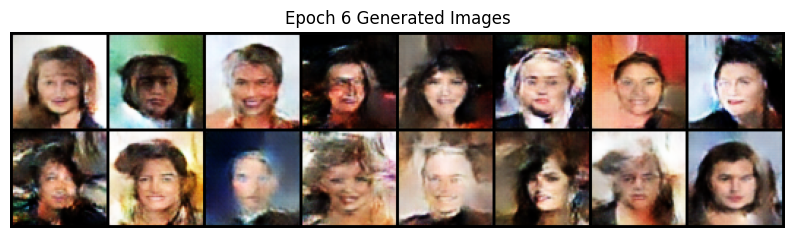

Inception Score (IS): 1.0556 ± 0.0077
Fréchet Inception Distance (FID): 201.7872


Epoch 7/20: 100%|██████████| 396/396 [09:26<00:00,  1.43s/it, D_Loss=-0.421, G_Loss=0.23]

Epoch [7/20] Loss D: -0.4205, Loss G: 0.2298


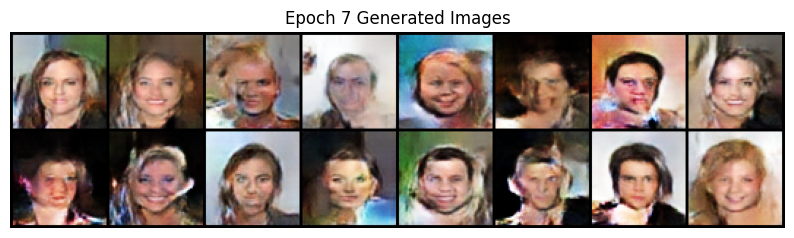

Inception Score (IS): 1.0542 ± 0.0095
Fréchet Inception Distance (FID): 187.0925


Epoch 8/20: 100%|██████████| 396/396 [09:24<00:00,  1.42s/it, D_Loss=-0.405, G_Loss=0.225]

Epoch [8/20] Loss D: -0.4048, Loss G: 0.2250


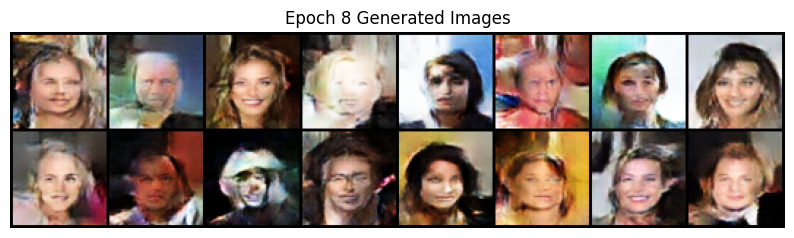

Inception Score (IS): 1.0557 ± 0.0078
Fréchet Inception Distance (FID): 174.9533


Epoch 9/20: 100%|██████████| 396/396 [09:24<00:00,  1.43s/it, D_Loss=-0.397, G_Loss=0.214]

Epoch [9/20] Loss D: -0.3970, Loss G: 0.2145


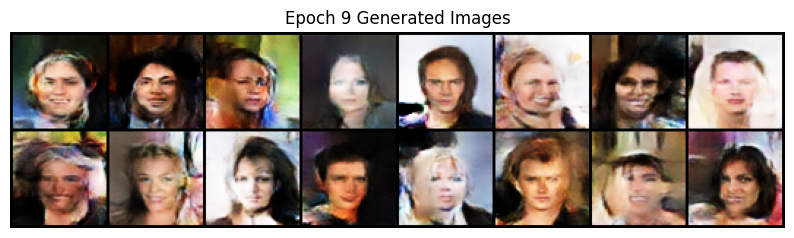

Inception Score (IS): 1.0548 ± 0.0077
Fréchet Inception Distance (FID): 164.9444


Epoch 10/20: 100%|██████████| 396/396 [09:25<00:00,  1.43s/it, D_Loss=-0.386, G_Loss=0.21]

Epoch [10/20] Loss D: -0.3855, Loss G: 0.2101


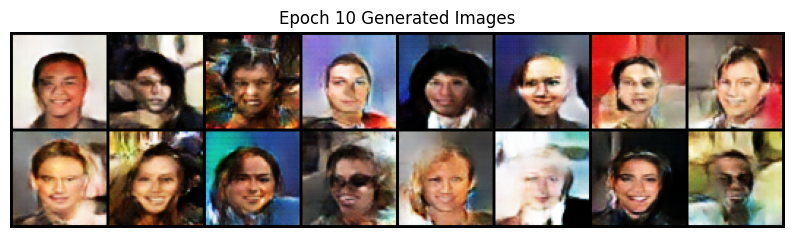

Inception Score (IS): 1.0551 ± 0.0063
Fréchet Inception Distance (FID): 158.3684


Epoch 11/20: 100%|██████████| 396/396 [09:27<00:00,  1.43s/it, D_Loss=-0.375, G_Loss=0.206]


Epoch [11/20] Loss D: -0.3752, Loss G: 0.2061


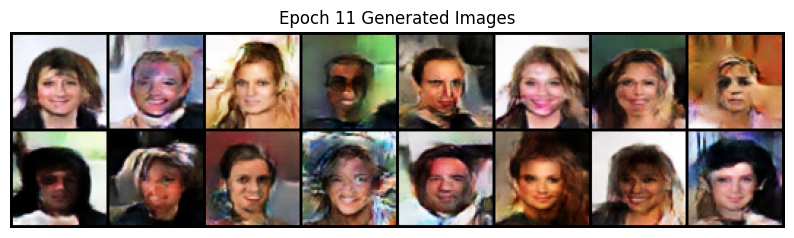

Inception Score (IS): 1.0547 ± 0.0069
Fréchet Inception Distance (FID): 152.1531


Epoch 12/20: 100%|██████████| 396/396 [09:27<00:00,  1.43s/it, D_Loss=-0.371, G_Loss=0.205]

Epoch [12/20] Loss D: -0.3712, Loss G: 0.2054


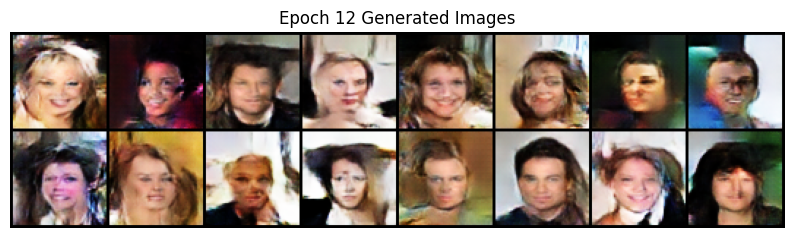

Inception Score (IS): 1.0553 ± 0.0026
Fréchet Inception Distance (FID): 145.8456


Epoch 13/20: 100%|██████████| 396/396 [09:29<00:00,  1.44s/it, D_Loss=-0.361, G_Loss=0.186]

Epoch [13/20] Loss D: -0.3615, Loss G: 0.1864


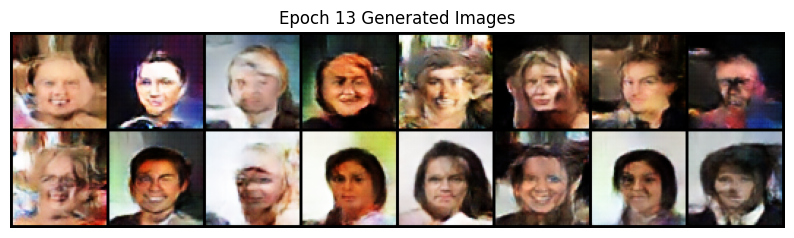

Inception Score (IS): 1.0552 ± 0.0070
Fréchet Inception Distance (FID): 140.5953


Epoch 14/20: 100%|██████████| 396/396 [09:30<00:00,  1.44s/it, D_Loss=-0.356, G_Loss=0.176]

Epoch [14/20] Loss D: -0.3561, Loss G: 0.1761


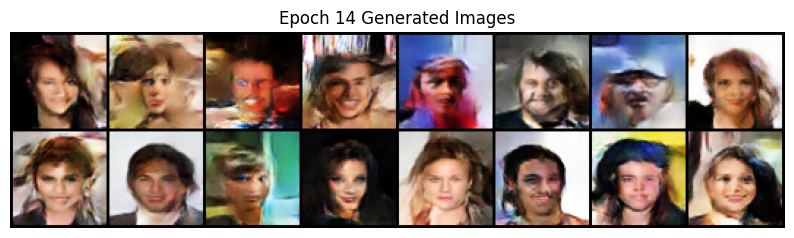

Inception Score (IS): 1.0555 ± 0.0038
Fréchet Inception Distance (FID): 135.8971


Epoch 15/20: 100%|██████████| 396/396 [09:32<00:00,  1.45s/it, D_Loss=-0.353, G_Loss=0.175]

Epoch [15/20] Loss D: -0.3535, Loss G: 0.1751


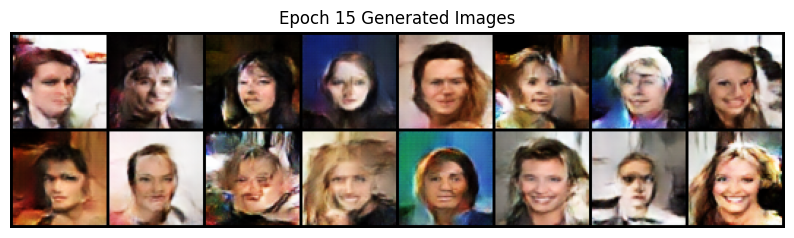

Inception Score (IS): 1.0556 ± 0.0040
Fréchet Inception Distance (FID): 132.0435


Epoch 16/20: 100%|██████████| 396/396 [09:33<00:00,  1.45s/it, D_Loss=-0.344, G_Loss=0.169]

Epoch [16/20] Loss D: -0.3441, Loss G: 0.1692


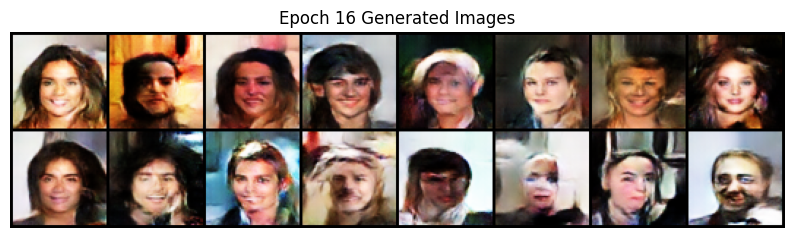

Inception Score (IS): 1.0554 ± 0.0050
Fréchet Inception Distance (FID): 127.6618


Epoch 17/20: 100%|██████████| 396/396 [09:33<00:00,  1.45s/it, D_Loss=-0.335, G_Loss=0.158]

Epoch [17/20] Loss D: -0.3352, Loss G: 0.1581


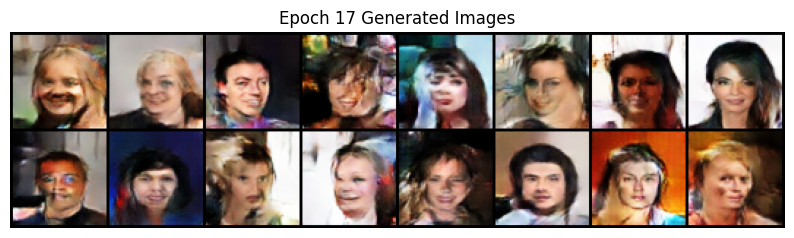

Inception Score (IS): 1.0559 ± 0.0028
Fréchet Inception Distance (FID): 123.8359


Epoch 18/20: 100%|██████████| 396/396 [09:35<00:00,  1.45s/it, D_Loss=-0.33, G_Loss=0.136]

Epoch [18/20] Loss D: -0.3303, Loss G: 0.1361


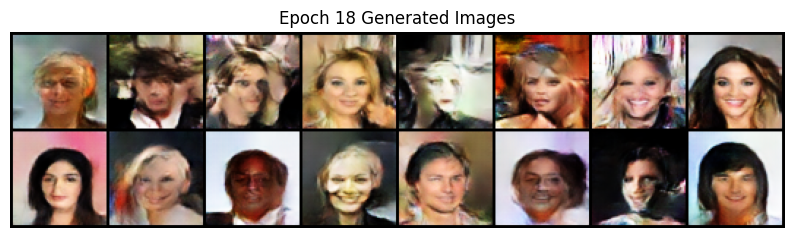

Inception Score (IS): 1.0558 ± 0.0043
Fréchet Inception Distance (FID): 120.2232


Epoch 19/20: 100%|██████████| 396/396 [09:36<00:00,  1.46s/it, D_Loss=-0.33, G_Loss=0.135]

Epoch [19/20] Loss D: -0.3300, Loss G: 0.1348


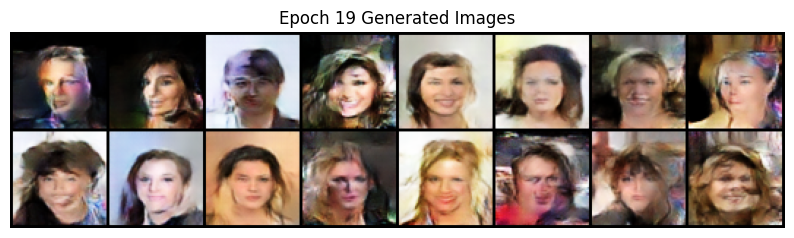

Inception Score (IS): 1.0555 ± 0.0025
Fréchet Inception Distance (FID): 116.5908


Epoch 20/20: 100%|██████████| 396/396 [09:52<00:00,  1.50s/it, D_Loss=-0.328, G_Loss=0.123]

Epoch [20/20] Loss D: -0.3282, Loss G: 0.1229


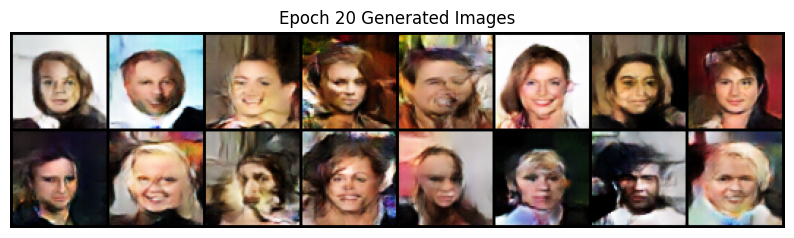

Inception Score (IS): 1.0554 ± 0.0032
Fréchet Inception Distance (FID): 113.2402


In [ ]:
for epoch in range(num_epochs):
    g_losses = []
    d_losses = []

    num_batches = len(train_loader) // 2

    with tqdm(enumerate(train_loader), total=num_batches, desc=f"Epoch {epoch+1}/{num_epochs}") as pbar:
        for i, (real_images, _) in pbar:
            if i >= num_batches:
                break
            real_images = real_images.to(device)
            current_batch_size = real_images.size(0)

            # train discriminator
            for _ in range(n_critic):
                optimizer_D.zero_grad()

                real_outputs = discriminator(real_images)
                fake_images = generator(torch.randn(current_batch_size, nz, 1, 1).to(device))
                fake_outputs = discriminator(fake_images.detach())

                d_loss = -torch.mean(real_outputs) + torch.mean(fake_outputs)
                d_loss.backward()
                optimizer_D.step()

                for p in discriminator.parameters():
                    p.data.clamp_(-weight_clip, weight_clip)

            # train generator
            optimizer_G.zero_grad()
            fake_outputs = discriminator(fake_images)
            g_loss = -torch.mean(fake_outputs)
            g_loss.backward()
            optimizer_G.step()

            g_losses.append(g_loss.item())
            d_losses.append(d_loss.item())

            pbar.set_postfix(D_Loss=np.mean(d_losses), G_Loss=np.mean(g_losses))

    g_loss_log.append(np.mean(g_losses))
    d_loss_log.append(np.mean(d_losses))

    print(f"Epoch [{epoch+1}/{num_epochs}] Loss D: {np.mean(d_losses):.4f}, Loss G: {np.mean(g_losses):.4f}")

    # generate/ visualize samples
    with torch.no_grad():
        z = torch.randn(16, nz, 1, 1).to(device)
        sample_images = generator(z)
        grid = vutils.make_grid(sample_images, normalize=True, scale_each=True)

        plt.figure(figsize=(10, 10))
        plt.axis("off")
        plt.title(f"Epoch {epoch+1} Generated Images")
        plt.imshow(grid.permute(1, 2, 0).cpu().numpy())
        plt.show()

        sample_images_uint8 = ((sample_images + 1) * 127.5).clamp(0, 255).to(torch.uint8)
        real_images_uint8 = ((real_images + 1) * 127.5).clamp(0, 255).to(torch.uint8)

        inception_score.update(sample_images_uint8.to(device))  # Ensure it's on the correct device
        fid_score.update(sample_images_uint8.to(device), real=True)
        fid_score.update(real_images_uint8.to(device), real=False)  # Move real images to the correct device

        is_mean, is_std = inception_score.compute()
        fid_value = fid_score.compute()

        print(f"Inception Score (IS): {is_mean:.4f} ± {is_std:.4f}")
        print(f"Fréchet Inception Distance (FID): {fid_value:.4f}")

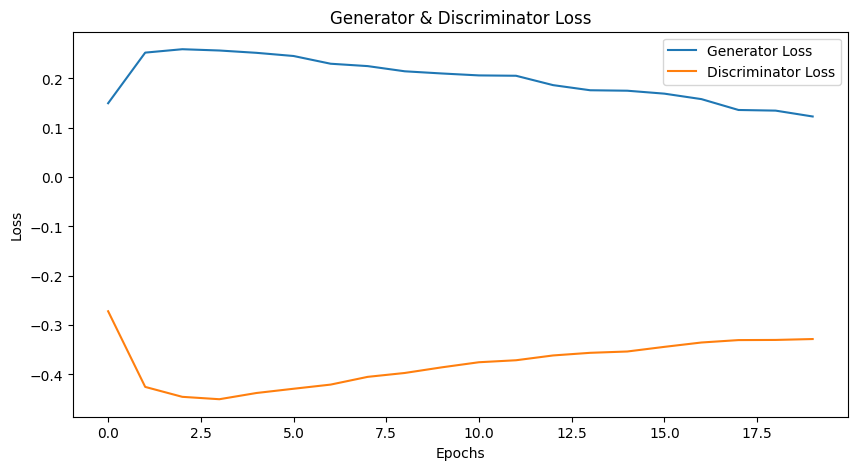

In [ ]:
plt.figure(figsize=(10, 5))
plt.plot(range(num_epochs), g_loss_log, label="Generator Loss")
plt.plot(range(num_epochs), d_loss_log, label="Discriminator Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.title("Generator & Discriminator Loss")
plt.show()

In [ ]:
torch.save(generator.state_dict(), "wgan-generator.pth")
torch.save(discriminator.state_dict(), "wgan-discriminator.pth")

print("Model saved successfully!")

Model saved successfully!


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
model_path = "/content/drive/MyDrive/wgan-generator.pth"
torch.save(generator.state_dict(), model_path)


model_path = "/content/drive/MyDrive/wgan-discriminator.pth"
torch.save(discriminator.state_dict(), model_path)

print(f"Model saved to {model_path} successfully!")

Model saved to /content/drive/MyDrive/wgan-discriminator.pth successfully!


### CNN for "Young" and "Old" classification

In [ ]:
attr_file = "celeba/list_attr_celeba.csv"

attr_df = pd.read_csv(attr_file)

print(attr_df.head())
print(attr_df.columns)

     image_id  5_o_Clock_Shadow  Arched_Eyebrows  Attractive  Bags_Under_Eyes  \
0  000001.jpg                -1                1           1               -1   
1  000002.jpg                -1               -1          -1                1   
2  000003.jpg                -1               -1          -1               -1   
3  000004.jpg                -1               -1           1               -1   
4  000005.jpg                -1                1           1               -1   

   Bald  Bangs  Big_Lips  Big_Nose  Black_Hair  ...  Sideburns  Smiling  \
0    -1     -1        -1        -1          -1  ...         -1        1   
1    -1     -1        -1         1          -1  ...         -1        1   
2    -1     -1         1        -1          -1  ...         -1       -1   
3    -1     -1        -1        -1          -1  ...         -1       -1   
4    -1     -1         1        -1          -1  ...         -1       -1   

   Straight_Hair  Wavy_Hair  Wearing_Earrings  Wearing_Hat  We

In [ ]:
class CelebAWithLabels(Dataset):
    def __init__(self, dataset, attr_df):
        self.dataset = dataset
        self.attr_df = attr_df.set_index("image_id")
        self.image_filenames = [img_path.split("/")[-1] for img_path, _ in dataset.imgs]

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        image, _ = self.dataset[idx]
        img_name = self.image_filenames[idx]

        if img_name not in self.attr_df.index:
            raise KeyError(f"Image {img_name} not found in labels file!")

        label = self.attr_df.loc[img_name, "Young"]
        label = (label + 1) // 2
        label = torch.tensor(label, dtype=torch.float32)

        return image, label

dataset = CelebAWithLabels(dataset, attr_df)
print(f"Dataset size after adding labels: {len(dataset)}")

Dataset size after adding labels: 202599


In [ ]:
image, label = dataset[17]
print("Sample label:", label)

Sample label: tensor(0.)


In [ ]:
train_size = int(0.8 * len(dataset))
val_size = int(0.1 * len(dataset))
test_size = len(dataset) - train_size - val_size

train_dataset, val_dataset, test_dataset = random_split(dataset, [train_size, val_size, test_size])

batch_size = 64
cnn_train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
cnn_val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
cnn_test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

print(f"Train size: {len(train_dataset)}, Val size: {len(val_dataset)}, Test size: {len(test_dataset)}")

Train size: 162079, Val size: 20259, Test size: 20261


In [ ]:
class CNN(nn.Module):
    def __init__(self):
        super(CNN, self).__init__()
        self.conv_layers = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),  # Extra layer
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )

        self.fc_layers = nn.Sequential(
            nn.Flatten(),
            nn.Linear(256 * 4 * 4, 512),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(512, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.conv_layers(x)
        x = self.fc_layers(x)
        return x

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = CNN().to(device)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
criterion = torch.nn.BCELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

num_epochs = 10

train_losses = []
val_losses = []

for epoch in range(num_epochs):
    model.train()
    train_loss, correct, total = 0.0, 0, 0

    for images, labels in cnn_train_loader:
        images, labels = images.to(device), labels.to(device).float()
        labels = labels.view(-1, 1)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        train_loss += loss.item()
        preds = (outputs > 0.5).float()
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    train_acc = correct / total
    avg_train_loss = train_loss / len(cnn_train_loader)
    train_losses.append(train_loss / len(train_loader))

    model.eval()
    val_loss, correct, total = 0.0, 0, 0

    with torch.no_grad():
        for images, labels in cnn_val_loader:
            images, labels = images.to(device), labels.to(device).float()
            labels = labels.view(-1, 1)

            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item()

            preds = (outputs > 0.5).float()
            correct += (preds == labels).sum().item()
            total += labels.size(0)

    val_acc = correct / total
    avg_val_loss = val_loss / len(val_loader)
    val_losses.append(val_loss / len(val_loader))

    print(f"Epoch {epoch+1}/{num_epochs} | Train Loss: {avg_train_loss:.4f}, Train Acc: {train_acc:.4f} | Val Loss: {avg_val_loss:.4f}, Val Acc: {val_acc:.4f}")

Epoch 1/10 | Train Loss: 0.4284, Train Acc: 0.8299 | Val Loss: 0.3232, Val Acc: 0.8674
Epoch 2/10 | Train Loss: 0.3286, Train Acc: 0.8605 | Val Loss: 0.3135, Val Acc: 0.8707
Epoch 3/10 | Train Loss: 0.3063, Train Acc: 0.8747 | Val Loss: 0.2939, Val Acc: 0.8785
Epoch 4/10 | Train Loss: 0.2890, Train Acc: 0.8831 | Val Loss: 0.2874, Val Acc: 0.8808
Epoch 5/10 | Train Loss: 0.2713, Train Acc: 0.8906 | Val Loss: 0.2979, Val Acc: 0.8752
Epoch 6/10 | Train Loss: 0.2541, Train Acc: 0.8979 | Val Loss: 0.2882, Val Acc: 0.8808
Epoch 7/10 | Train Loss: 0.2324, Train Acc: 0.9054 | Val Loss: 0.3406, Val Acc: 0.8749
Epoch 8/10 | Train Loss: 0.2068, Train Acc: 0.9161 | Val Loss: 0.3279, Val Acc: 0.8793
Epoch 9/10 | Train Loss: 0.1816, Train Acc: 0.9259 | Val Loss: 0.3407, Val Acc: 0.8744
Epoch 10/10 | Train Loss: 0.1529, Train Acc: 0.9378 | Val Loss: 0.3910, Val Acc: 0.8774


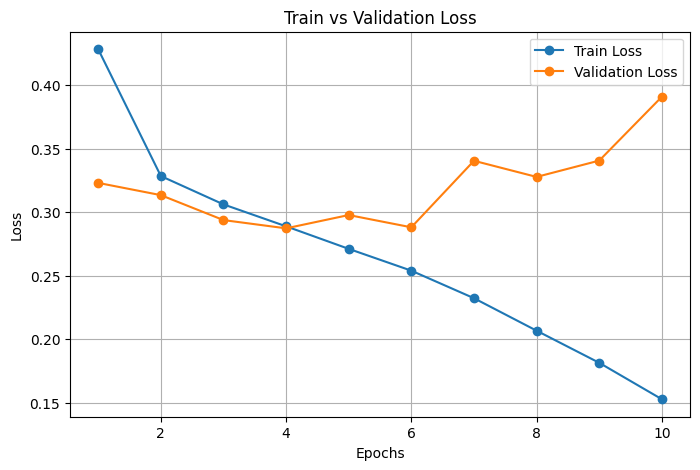

In [ ]:
plt.figure(figsize=(8, 5))
plt.plot(range(1, num_epochs + 1), train_losses, label="Train Loss", marker='o')
plt.plot(range(1, num_epochs + 1), val_losses, label="Validation Loss", marker='o')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Train vs Validation Loss")
plt.legend()
plt.grid()
plt.show()

In [ ]:
torch.save(model.state_dict(), "cnn_celeba.pth")

print("Model saved successfully!")

Model saved successfully!


In [ ]:
model_path = "/content/drive/MyDrive/cnn_celeba.pth"
torch.save(model.state_dict(), model_path)

print(f"Model saved to {model_path} successfully!")

Model saved to /content/drive/MyDrive/cnn_celeba.pth successfully!


In [ ]:
def evaluate_model(model, dataloader, threshold=0.5):
    model.eval()
    all_preds, all_labels = [], []

    with torch.no_grad():
        for images, labels in dataloader:
            images, labels = images.to(device), labels.to(device)

            outputs = model(images)

            probs = torch.sigmoid(outputs).squeeze()

            preds = (probs > threshold).float()

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    acc = accuracy_score(all_labels, all_preds)
    precision = precision_score(all_labels, all_preds, zero_division=1)
    recall = recall_score(all_labels, all_preds, zero_division=1)

    print(f"Test Accuracy: {acc:.4f}")
    print(f"Test Precision: {precision:.4f}")
    print(f"Test Recall: {recall:.4f}")

In [ ]:
evaluate_model(model, cnn_test_loader)

Test Accuracy: 0.7767
Test Precision: 0.7767
Test Recall: 1.0000


### Generate and Annotate Synthetic Data

#####Generate Synthetic Data

In [ ]:
generator = Generator(nz).to(device)
generator.load_state_dict(torch.load("wgan-generator.pth", map_location=device))
generator.eval()

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(160, 256, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(64, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(32, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

In [ ]:
num_synthetic_samples = int(len(train_dataset) * 0.28)

batch_size = 16
synthetic_images = []

with torch.no_grad():
    for i in range(0, num_synthetic_samples, batch_size):
        z = torch.randn(min(batch_size, num_synthetic_samples - i), nz, 1, 1).to(device)  # Correct shape
        batch_images = generator(z)
        synthetic_images.append(batch_images.cpu())

synthetic_images = torch.cat(synthetic_images, dim=0)

synthetic_images = (synthetic_images + 1) / 2

print(f"Generated {synthetic_images.shape[0]} synthetic images of shape {synthetic_images.shape[1:]}")

Generated 45382 synthetic images of shape torch.Size([3, 64, 64])


In [ ]:
transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor(),
])

synthetic_dataset = TensorDataset(synthetic_images)
synthetic_loader = DataLoader(synthetic_dataset, batch_size=32, shuffle=False)

print(f"Generated {num_synthetic_samples} synthetic images")

Generated 45382 synthetic images


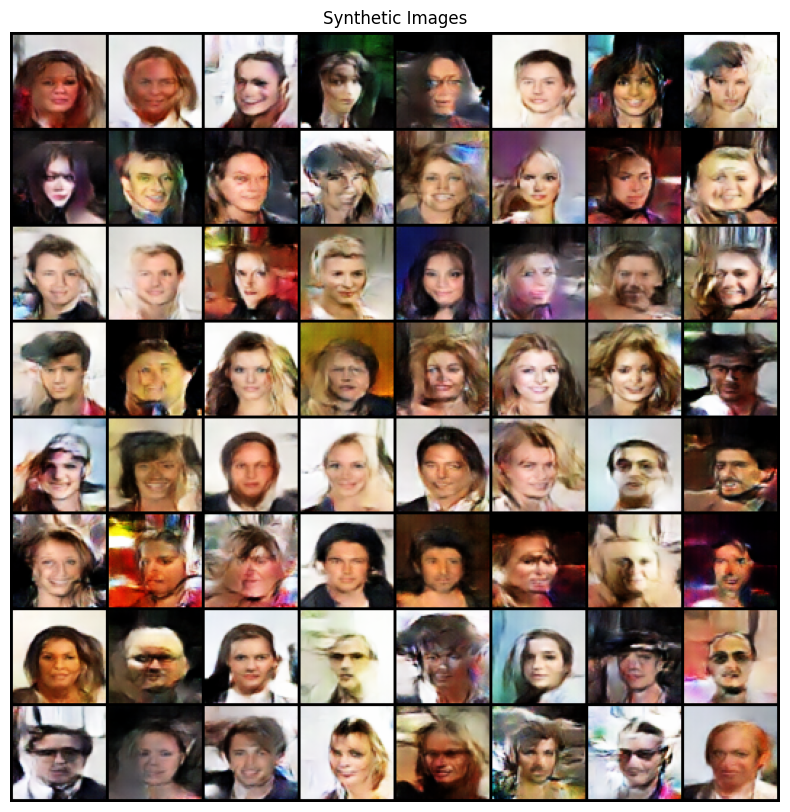

In [ ]:
num_display = 64
sample_images = synthetic_images[:num_display]

grid = vutils.make_grid(sample_images, nrow=8, normalize=True, scale_each=True)

plt.figure(figsize=(10, 10))
plt.axis("off")
plt.title("Synthetic Images")
plt.imshow(grid.permute(1, 2, 0).cpu().numpy())
plt.show()

#####Annotate Synthetic Data

In [ ]:
cnn_celeba = CNN().to(device)
cnn_celeba.load_state_dict(torch.load("cnn_celeba.pth", map_location=device))
cnn_celeba.eval()

CNN(
  (conv_layers): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU()
    (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (8): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU()
    (11): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (12): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  

In [ ]:
synthetic_image_filenames = [f"synthetic_{i}.jpg" for i in range(len(synthetic_images))]
annotated_data = []

with torch.no_grad():
    for i, batch in enumerate(synthetic_loader):
        images = batch[0].to(device)
        outputs = model(images)
        predictions = (outputs.squeeze() > 0.5).long().cpu().numpy()

        for j, pred in enumerate(predictions):
            annotated_data.append((synthetic_image_filenames[i * batch_size + j], pred))

annotated_df = pd.DataFrame(annotated_data, columns=["image_id", "Young"])

print(annotated_df.head())

          image_id  Young
0  synthetic_0.jpg      0
1  synthetic_1.jpg      0
2  synthetic_2.jpg      0
3  synthetic_3.jpg      1
4  synthetic_4.jpg      0


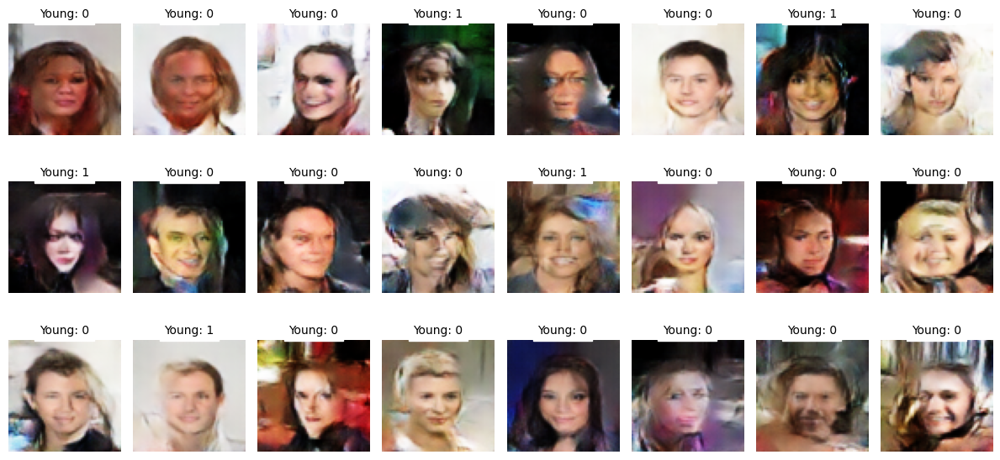

In [ ]:
num_display = 24
sample_images = synthetic_images[:num_display].cpu()
sample_labels = annotated_df["Young"][:num_display].tolist()

fig, axes = plt.subplots(3, 8, figsize=(12, 6))

for i, ax in enumerate(axes.flat):
    img = sample_images[i].permute(1, 2, 0).numpy()
    ax.imshow(img, cmap="gray")
    ax.axis("off")

    ax.set_title(f"Young: {sample_labels[i]}", fontsize=10, color="black", backgroundcolor="white", pad=5)

plt.tight_layout()
plt.show()

### Train CNN on 70% synthetic and 30% real data

In [ ]:
synthetic_labels = torch.tensor(annotated_df["Young"].values, dtype=torch.float32).unsqueeze(1)
synthetic_dataset = TensorDataset(synthetic_images, synthetic_labels)

num_real_samples = int(0.12 * len(train_dataset))

indices = np.random.choice(len(train_dataset), num_real_samples, replace=False)

real_images = []
real_labels = []

for idx in indices:
    img, label = train_dataset[idx]
    real_images.append(img)
    real_labels.append(torch.tensor(label, dtype=torch.float32).unsqueeze(0))

real_images = torch.stack(real_images)
real_labels = torch.stack(real_labels)

real_subset = TensorDataset(real_images, real_labels)

combined_dataset = ConcatDataset([synthetic_dataset, real_subset])

batch_size = 64
train_loader = DataLoader(combined_dataset, batch_size=batch_size, shuffle=True)

print(f"Final training dataset size: {len(combined_dataset)} (70% Synthetic, 30% Real)")

<ipython-input-79-e7bac817222c>:14: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  real_labels.append(torch.tensor(label, dtype=torch.float32).unsqueeze(0))


Final training dataset size: 64831 (70% Synthetic, 30% Real)


In [ ]:
cnn_classifier = CNN().to(device)
criterion = torch.nn.BCELoss()
optimizer = optim.Adam(model.parameters(), lr=0.0005)

In [ ]:
num_epochs = 10

for epoch in range(num_epochs):
    cnn_classifier.train()
    total_loss = 0

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device).float().squeeze(1)

        optimizer.zero_grad()
        outputs = cnn_classifier(images).squeeze()
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {total_loss/len(train_loader):.4f}")

torch.save(cnn_classifier.state_dict(), "cnn_mixed.pth")

Epoch [1/10], Loss: 0.7326
Epoch [2/10], Loss: 0.7319
Epoch [3/10], Loss: 0.7317
Epoch [4/10], Loss: 0.7326
Epoch [5/10], Loss: 0.7316
Epoch [6/10], Loss: 0.7318
Epoch [7/10], Loss: 0.7316
Epoch [8/10], Loss: 0.7313
Epoch [9/10], Loss: 0.7312
Epoch [10/10], Loss: 0.7315


In [ ]:
evaluate_model(cnn_classifier, cnn_test_loader)

Test Accuracy: 0.7738
Test Precision: 0.7738
Test Recall: 1.0000
